In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

### READING DATASET

In [2]:
df= pd.read_csv('Reviews.csv')
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [3]:
df.shape

(568454, 10)

### PERFORMING SENTIMENT ANALYSIS ON DATA

In [4]:
 from textblob import TextBlob

In [5]:
df['Summary'][0]                      ##First summary given by the customer

'Good Quality Dog Food'

In [6]:
## Storing it in a Text
text= df['Summary'][0]
text

'Good Quality Dog Food'

In [7]:
## Performing sentiment analysis using textblob class
TextBlob(df['Summary'][0]).sentiment.polarity    ## Passing text in textblob and fetching the polarity of the sentiment


0.7

In [8]:
polarity=[]        ## It will contain polarity of comments
for i in df['Summary']:
    try:
        polarity.append(TextBlob(i).sentiment.polarity)   
    except:
        polarity.append(0)

In [9]:
len(polarity)

568454

In [10]:
## inserting polarity in dataframe
data=df.copy()

In [11]:
## defining new column
data['Polarity']= polarity


In [12]:
data.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Polarity
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,0.7
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,0.0
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,0.0
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,0.0
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,0.8


### Performing EDA(Exploratary Data Analysis) for positive sentences.


In [13]:
data_positive = data[data['Polarity'] > 0]

In [14]:
data_positive.shape

(331665, 11)

In [15]:
from wordcloud import WordCloud, STOPWORDS

In [16]:
stopwords=set(STOPWORDS)  ## Providing uniqueness

In [17]:
total_text= (' '.join(data_positive['Summary']))     ## Joining summary column

In [18]:
len(total_text)

8465012

In [19]:
total_text[0:10000]            ## first 10000 words

'Good Quality Dog Food Great taffy Nice Taffy Great!  Just as good as the expensive brands! Wonderful, tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this "diet" food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy! Love it! GREAT SWEET CANDY! Always fresh Delicious product! Great Bargain for the Price The Best Hot Sauce in the World Great machine! Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry! satisfying Love Gluten Free Oatmeal!!! GOOD WAY TO START THE DAY.... Wife\'s favorite Breakfast Why wouldn\'t you buy oatmeal from Mcanns? Tastes great! Good Hot Breakfast Great taste and convenience good Very good but next time I won\'t order the Variety Pack HOT!  And good!  Came back for more  :) Roasts up a smooth brew Our guests love it! Awesome Deal! Awsome - Kids in neighborhood loved us! great deal. Better price for this at Target great source of electrolytes Great for preventing cramps T

In [20]:
## Removing special characters
import re
total_text=re.sub('[^a-zA-Z]',' ',total_text)

In [21]:
total_text[0:10000]

'Good Quality Dog Food Great taffy Nice Taffy Great   Just as good as the expensive brands  Wonderful  tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this  diet  food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy  Love it  GREAT SWEET CANDY  Always fresh Delicious product  Great Bargain for the Price The Best Hot Sauce in the World Great machine  Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry  satisfying Love Gluten Free Oatmeal    GOOD WAY TO START THE DAY     Wife s favorite Breakfast Why wouldn t you buy oatmeal from Mcanns  Tastes great  Good Hot Breakfast Great taste and convenience good Very good but next time I won t order the Variety Pack HOT   And good   Came back for more     Roasts up a smooth brew Our guests love it  Awesome Deal  Awsome   Kids in neighborhood loved us  great deal  Better price for this at Target great source of electrolytes Great for preventing cramps Tast

In [22]:
## Removing Extra Spaces
total_text=re.sub(' +',' ',total_text)

In [23]:
total_text[0:10000]

'Good Quality Dog Food Great taffy Nice Taffy Great Just as good as the expensive brands Wonderful tasty taffy Healthy Dog Food The Best Hot Sauce in the World My cats LOVE this diet food better than their regular food My Cats Are Not Fans of the New Food fresh and greasy Love it GREAT SWEET CANDY Always fresh Delicious product Great Bargain for the Price The Best Hot Sauce in the World Great machine Best of the Instant Oatmeals Good Instant Great Irish oatmeal for those in a hurry satisfying Love Gluten Free Oatmeal GOOD WAY TO START THE DAY Wife s favorite Breakfast Why wouldn t you buy oatmeal from Mcanns Tastes great Good Hot Breakfast Great taste and convenience good Very good but next time I won t order the Variety Pack HOT And good Came back for more Roasts up a smooth brew Our guests love it Awesome Deal Awsome Kids in neighborhood loved us great deal Better price for this at Target great source of electrolytes Great for preventing cramps Taste is not so good How much would you

(-0.5, 999.5, 499.5, -0.5)

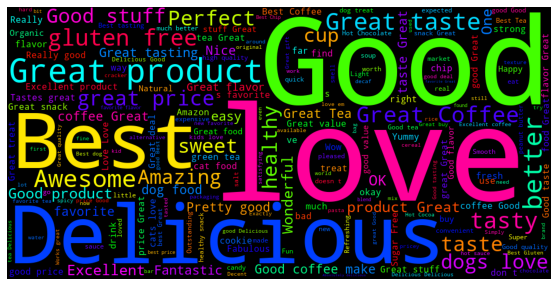

In [24]:
wordcloud = WordCloud(width = 1000, height = 500,background_color='black',mode='RGB',colormap='hsv',stopwords=stopwords).generate(total_text)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

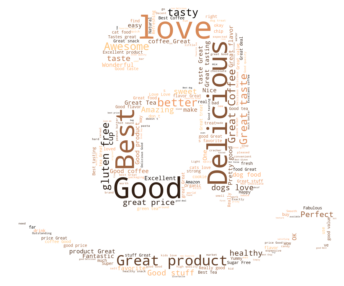

In [102]:
### Customize wordcloud
from PIL import Image
stopwords=set(stopwords)
mask=np.array(Image.open("C:/Users/shiv/Desktop/PRARTHANA/amazon_PNG5.png"))
wordcloud = WordCloud(width = 2500, height = 2000,background_color='white',mode='RGB',colormap='copper',mask=mask,stopwords=stopwords).generate(total_text)
plt.figure(figsize=(10,5))
plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()


### Performing EDA(Exploratary Data Analysis) for negative sentences.

In [26]:
data_negative = data[data['Polarity'] < 0]

In [27]:
data_negative.shape

(52516, 11)

In [28]:
total_text2= (' '.join(data_negative['Summary']))

In [29]:
len(total_text2)

1438541

In [30]:
total_text2[0:10000]    

'poor taste Nasty No flavor How can you go wrong! pretty expensive stale product. Bigger then other brands Order only in cold weather Bad disappointing My every day green tea BROKEN BOTTLE BOTTOMS! Tasteless but low calorie Marley\'s Mellow Mood Lite - Half Tea Half Lemonade Nearly killed the cats CHANGED FORMULA MAKES CATS SICK!!!! Not a real tea Mcclures bloody Mary mix Not Good Eukanuba puppy small breed dog food My everyday cup of Tea Disappointed Sad outcome Don\'t Waste Your Money Disappointed! sugar in the raw Good product but terrible agricultural practices Sugar in the raw Sugar in the raw too expensive Not sure So awful I can barely describe AWFUL Bitter A saving grace for Green Mountain Coffee... Fantastic Chicken Noodle soup Heinz no more! Disappointing Waste of money Ham Base MSG Ham Base Love the product disappointed in the shipping. poor item packaging Awful disappointing Hard a slight taste of jalapeno Heavy on the Vinegar These chips make me weak at the knees Not bad b

In [31]:
## Removing Extra Spaces
total_text2=re.sub(' +',' ',total_text2)

In [32]:
total_text2[0:10000]

'poor taste Nasty No flavor How can you go wrong! pretty expensive stale product. Bigger then other brands Order only in cold weather Bad disappointing My every day green tea BROKEN BOTTLE BOTTOMS! Tasteless but low calorie Marley\'s Mellow Mood Lite - Half Tea Half Lemonade Nearly killed the cats CHANGED FORMULA MAKES CATS SICK!!!! Not a real tea Mcclures bloody Mary mix Not Good Eukanuba puppy small breed dog food My everyday cup of Tea Disappointed Sad outcome Don\'t Waste Your Money Disappointed! sugar in the raw Good product but terrible agricultural practices Sugar in the raw Sugar in the raw too expensive Not sure So awful I can barely describe AWFUL Bitter A saving grace for Green Mountain Coffee... Fantastic Chicken Noodle soup Heinz no more! Disappointing Waste of money Ham Base MSG Ham Base Love the product disappointed in the shipping. poor item packaging Awful disappointing Hard a slight taste of jalapeno Heavy on the Vinegar These chips make me weak at the knees Not bad b

(-0.5, 999.5, 499.5, -0.5)

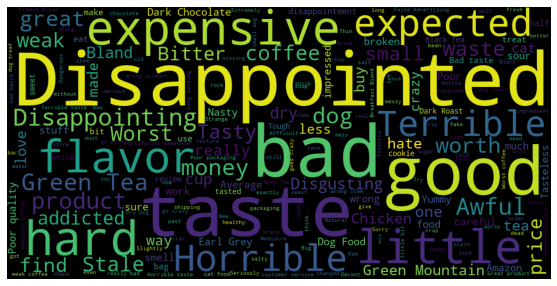

In [33]:
wordcloud = WordCloud(width = 1000, height = 500,background_color='black',mode='RGB',stopwords=stopwords).generate(total_text2)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

### ANALYSING TO WHAT USER AMAZON CAN RECOMMEND MORE PRODUCT.

In [34]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [35]:
df['UserId'].nunique()

256059

In [36]:
raw=df.groupby('UserId').agg({'Summary':'count','Text':'count','Score':'mean','ProductId':'count'}).sort_values(by='Text',ascending=False)
raw

,Summary,Text,Score,ProductId
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [37]:
## Assigning column names
raw.columns=['num_summaries','num_text','Avg_Score','no_of_products_purchased']
raw


,num_summaries,num_text,Avg_Score,no_of_products_purchased
UserId,,,,
A3OXHLG6DIBRW8,448,448,4.535714,448
A1YUL9PCJR3JTY,421,421,4.494062,421
AY12DBB0U420B,389,389,4.647815,389
A281NPSIMI1C2R,365,365,4.841096,365
A1Z54EM24Y40LL,256,256,4.453125,256
...,...,...,...,...
A2HROKQO0GA5AF,1,1,3.000000,1
A2HROR28DMJV2W,1,1,5.000000,1
A2HRR8CO2Y20G8,1,1,5.000000,1


In [38]:
## Top 10

In [39]:
## X-axis
user_10=raw.index[0:10]

In [40]:
## Y-axis
number_10=raw['no_of_products_purchased'][0:10]

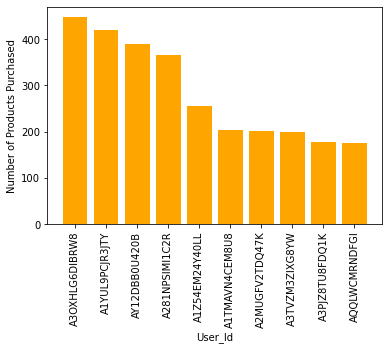

In [41]:
## plotting chart
plt.bar(user_10, number_10, label='Most Recommended User',color='orange')
plt.xlabel('User_Id')
plt.ylabel('Number of Products Purchased')
plt.xticks(rotation='vertical')
plt.show()

#### These are the Top 10 Users so we can recommend more & more Prodcuts to these User Id as there will be a high probability that these person are going to be buy more.

### Analysing Length of Comments whether Customers are going to give Lengthy comments or short one

In [42]:
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [43]:
## Length of the feedback of 1st comment
len(df['Text'][0].split(' '))

49

In [44]:
## Length of every feedback
def calc_len(text):
    return (len(text.split(' ')))

In [45]:
## Using Map function
df['Text_length']=df['Text'].apply(calc_len)

In [46]:
import plotly.express as px
px.box(df, y="Text_length")

CONCLUSION:
As here it seems to have Almost 50 percent users are going to give their Feedback limited to 50 words whereas there are only few users who are going give Lengthy Feedbacks

C:\Users\shiv\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='Score', ylabel='count'>

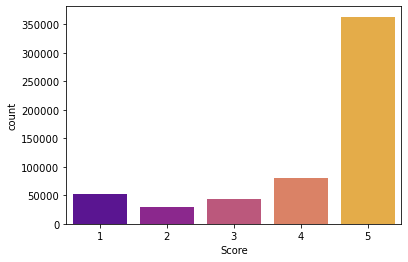

In [47]:
## ANALYSING SCORE
sns.countplot(df['Score'], palette="plasma")

### Analysing behaviour of the customer

In [48]:
df.shape

(568454, 11)

In [49]:
## picking sample
final=df.sample(n=2000)

In [50]:
final=df[0:2000]

In [51]:
## checking missing values
final.isna().sum()

Id                        0
ProductId                 0
UserId                    0
ProfileName               0
HelpfulnessNumerator      0
HelpfulnessDenominator    0
Score                     0
Time                      0
Summary                   0
Text                      0
Text_length               0
dtype: int64

In [52]:
## removing duplicates if there are any
final.duplicated().sum()

0

#### Text pre-processing

In [53]:
final['Text']=final['Text'].str.lower()
final.head()

C:\Users\shiv\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price. there was a wid...,30


In [54]:
final['Text'][70]

"these albanese gummi bears and rings and so on are very good and tasty and high quality. the bears even have little faces. at my local candy store this type of gummi stuff (bears, rings, snakes, balls, worms, whatever) are about $10/lb. these twin packs of 4.5 or 5 pound bags is a screaming deal as far as i'm concerned. i'm probably 50 pounds deep in these friggin' things. consumed!"

In [55]:
import re
re.sub('[^a-zA-Z]',' ',final['Text'][70])

'these albanese gummi bears and rings and so on are very good and tasty and high quality  the bears even have little faces  at my local candy store this type of gummi stuff  bears  rings  snakes  balls  worms  whatever  are about     lb  these twin packs of     or   pound bags is a screaming deal as far as i m concerned  i m probably    pounds deep in these friggin  things  consumed '

As re is removing numerical data from final

In [56]:
## Removing punctuation or special characters
# define special characters
spl_chars = '''!()-[]{};:'"\,<>./?@#$%^&*_~'''

data= final['Text'][70]

# remove punctuation from the string
no_punct = ""
for char in data:
    if char not in spl_chars:
        no_punct = no_punct + char

# display the unpunctuated string
no_punct

'these albanese gummi bears and rings and so on are very good and tasty and high quality the bears even have little faces at my local candy store this type of gummi stuff bears rings snakes balls worms whatever are about 10lb these twin packs of 45 or 5 pound bags is a screaming deal as far as im concerned im probably 50 pounds deep in these friggin things consumed'

In [57]:
def remove_punc(review):
    import string
    punctuations =string.punctuation
    # remove punctuation from the string
    no_punct = ""
    for char in review:
        if char not in punctuations:
            no_punct = no_punct + char
    return no_punct

In [58]:
final['Text'] =final['Text'].apply(remove_punc)

C:\Users\shiv\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [59]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,i have bought several of the vitality canned d...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled as jumbo salted peanut...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",this is a confection that has been around a fe...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,if you are looking for the secret ingredient i...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy at a great price there was a wide...,30


In [60]:
final['Text'][70]

'these albanese gummi bears and rings and so on are very good and tasty and high quality the bears even have little faces at my local candy store this type of gummi stuff bears rings snakes balls worms whatever are about 10lb these twin packs of 45 or 5 pound bags is a screaming deal as far as im concerned im probably 50 pounds deep in these friggin things consumed'

#### Removal of Stopwords

In [61]:
import nltk

In [62]:
from nltk.corpus import stopwords

In [63]:
a=final['Text'][70]
a

'these albanese gummi bears and rings and so on are very good and tasty and high quality the bears even have little faces at my local candy store this type of gummi stuff bears rings snakes balls worms whatever are about 10lb these twin packs of 45 or 5 pound bags is a screaming deal as far as im concerned im probably 50 pounds deep in these friggin things consumed'

In [64]:
[word for word in a.split(' ') if word not in set(stopwords.words('english'))]

['albanese',
 'gummi',
 'bears',
 'rings',
 'good',
 'tasty',
 'high',
 'quality',
 'bears',
 'even',
 'little',
 'faces',
 'local',
 'candy',
 'store',
 'type',
 'gummi',
 'stuff',
 'bears',
 'rings',
 'snakes',
 'balls',
 'worms',
 'whatever',
 '10lb',
 'twin',
 'packs',
 '45',
 '5',
 'pound',
 'bags',
 'screaming',
 'deal',
 'far',
 'im',
 'concerned',
 'im',
 'probably',
 '50',
 'pounds',
 'deep',
 'friggin',
 'things',
 'consumed']

In [65]:
re=[word for word in a.split(' ') if word not in set(stopwords.words('english'))]
str=''
for wd in re:
    str=str+wd
    str=str+' '
str

'albanese gummi bears rings good tasty high quality bears even little faces local candy store type gummi stuff bears rings snakes balls worms whatever 10lb twin packs 45 5 pound bags screaming deal far im concerned im probably 50 pounds deep friggin things consumed '

In [66]:
## using join to convert it into string
re=[word for word in a.split(' ') if word not in set(stopwords.words('english'))]
' '.join(re)

'albanese gummi bears rings good tasty high quality bears even little faces local candy store type gummi stuff bears rings snakes balls worms whatever 10lb twin packs 45 5 pound bags screaming deal far im concerned im probably 50 pounds deep friggin things consumed'

In [67]:
## applying function to entire column
def remove_stopwords(a):
    return ' '.join([word for word in a.split(' ') if word not in set(stopwords.words('english'))])

In [68]:
remove_stopwords(a)

'albanese gummi bears rings good tasty high quality bears even little faces local candy store type gummi stuff bears rings snakes balls worms whatever 10lb twin packs 45 5 pound bags screaming deal far im concerned im probably 50 pounds deep friggin things consumed'

In [69]:
final.shape


(2000, 11)

In [70]:
final.columns

Index(['Id', 'ProductId', 'UserId', 'ProfileName', 'HelpfulnessNumerator',
       'HelpfulnessDenominator', 'Score', 'Time', 'Summary', 'Text',
       'Text_length'],
      dtype='object')

In [71]:
final['Text'] = final['Text'].apply(remove_stopwords)

C:\Users\shiv\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [72]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,bought several vitality canned dog food produc...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",confection around centuries light pillowy cit...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,looking secret ingredient robitussin believe f...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy great price wide assortment yummy...,30


#### Pre-processing data in depth

In [73]:
final['Text'].str.contains('http').sum()

35

In [74]:
final['Text'].str.contains('http?').sum()

35

In [75]:
pd.set_option('display.max_rows',2000)
final['Text'].str.contains('http',regex=True)

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21       True
22      False
23      False
24      False
25       True
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39       True
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [76]:
final['Text'][39]

'ordered wife reccomended daughter  almost every morning likes flavors  shes happy im happybr hrefhttpwwwamazoncomgpproductb001eo5qw8mccanns instant irish oatmeal variety pack regular apples  cinnamon maple  brown sugar 10count boxes pack 6a'

#### Removal of urls

In [77]:
url=final['Text'][39]
url

'ordered wife reccomended daughter  almost every morning likes flavors  shes happy im happybr hrefhttpwwwamazoncomgpproductb001eo5qw8mccanns instant irish oatmeal variety pack regular apples  cinnamon maple  brown sugar 10count boxes pack 6a'

In [78]:
import re

In [79]:
url_pattern = re.compile(r'href|http.\w+')
url_pattern.sub(r'', url)

'ordered wife reccomended daughter  almost every morning likes flavors  shes happy im happybr  instant irish oatmeal variety pack regular apples  cinnamon maple  brown sugar 10count boxes pack 6a'

In [80]:
## Applying to text column
import re
def remove_urls(review):
    url_pattern = re.compile(r'href|http.\w+')
    return url_pattern.sub(r'', review)

In [81]:
final['Text'] = final['Text'].apply(remove_urls)

C:\Users\shiv\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [82]:
final.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,bought several vitality canned dog food produc...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",confection around centuries light pillowy cit...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,looking secret ingredient robitussin believe f...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy great price wide assortment yummy...,30


In [83]:
final['Text'][21]

'bought husband currently overseas loves apparently staff likes alsobr generous amounts twizzlers 16ounce bag well worth price  strawberry 16ounce bags pack 6a'

In [84]:
## checking urls
final['Text'].str.contains('http').sum()

0

#### Removal of br

In [85]:
final['Text'][34].replace('br','')

'instant oatmeal become soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent may take bit longer prepare time morning best instant and ive ever eaten close second noninstant variety  mccanns instant irish oatmeal variety pack regular apples  cinnamon maple  own sugar 10count boxes pack 6'

In [86]:
for i in range(len(final['Text'])):
    final['Text'][i]=final['Text'][i].replace('br','')

C:\Users\shiv\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [87]:
df2=final.copy()

In [88]:
df2['Text'][34]

'instant oatmeal become soggy minute water hits bowl mccanns instant oatmeal holds texture excellent flavor good time mccanns regular oat meal excellent may take bit longer prepare time morning best instant and ive ever eaten close second noninstant variety  mccanns instant irish oatmeal variety pack regular apples  cinnamon maple  own sugar 10count boxes pack 6'

In [89]:
df2.shape

(2000, 11)

In [90]:
df2.dtypes

Id                         int64
ProductId                 object
UserId                    object
ProfileName               object
HelpfulnessNumerator       int64
HelpfulnessDenominator     int64
Score                      int64
Time                       int64
Summary                   object
Text                      object
Text_length                int64
dtype: object

In [91]:
from wordcloud import WordCloud, STOPWORDS 

In [92]:
stopwords = set(STOPWORDS) 

In [93]:
df2.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,Text_length
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,bought several vitality canned dog food produc...,49
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,product arrived labeled jumbo salted peanutsth...,31
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",confection around centuries light pillowy cit...,99
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,looking secret ingredient robitussin believe f...,43
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,great taffy great price wide assortment yummy...,30


In [94]:
comment_words = '' 
for val in df2['Text']:
    # typecaste each val to string
    
    # split the value 
    tokens = val.split() 
    
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
    comment_words=comment_words+ " ".join(tokens)+" "
    

In [95]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

(-0.5, 799.5, 799.5, -0.5)

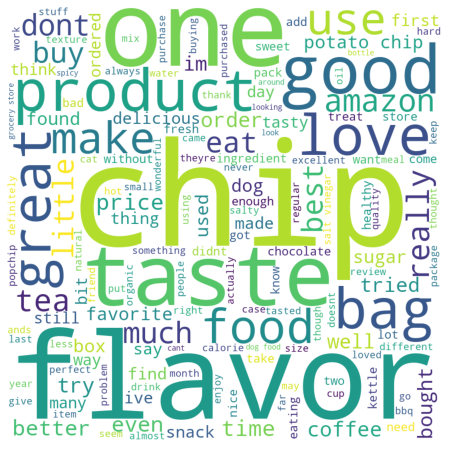

In [96]:
# plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 